# Exploratory Data Analysis for Time Series

In this notebook we will focus on studying the main time series components for each of the variables. The steps will be described below, but they will be repeated in each one of the variables. This analysis comes after the initial EDA done block by block, where we studied the different data fields and their distribution.

First of all, we will define some basic time series concepts (they are explained in natural language, for more information, refer to the complete thesis):
- **Stationarity**: a stationary time series is a time series where statistical properties do not change over time.
- **Time series decomposition**: when we consider a series as a combination of level, trend, seasonality and noise components, we can have an additive model or a multiplicative model.
- **Trend**: a trend component is the result of a varying mean over time.
- **Seasonality**: the seasonality component is a changing variance over time.
- **Differencing**: data transformation used to make a series stationary, it is performed by subtracting the previous observation from the current observation.
- **Lag difference**: the difference between consecutive observations is called a lag-1 difference.


## Imports

In [1]:
# Basic imports

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.stats.stattools import durbin_watson

from scipy import signal

from scipy.stats import normaltest
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

import statsmodels.api as sm
import pymannkendall as mk

from pandas.plotting import autocorrelation_plot
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()
sns.set_style("darkgrid")
path = "../../data_postprocess/data_nuevo/"
path_bruto = "../../data/"

plt.rc("figure", figsize=(16, 12))
plt.rc("font", size=13)



In [2]:
def plot_detrends(df, var):

    fig, axes = plt.subplots(nrows=3,ncols=1, figsize=(10,10) )
    diff = df[var].diff()

    axes[0].plot(diff)
    axes[0].set_title('Detrending using Differencing', fontsize=12) 
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel(var)


    detrended = signal.detrend(df[var].values)
    axes[1].plot(detrended)
    axes[1].set_title('Detrending using Scipy Signal', fontsize=12) 
    axes[1].set_xlabel(var)
    axes[1].set_ylabel('Frequency')

    eu_cycle,eu_trend = hpfilter(df[var], lamb=100*(52*4*24*7)**2)
    detrended = df[var]-eu_trend
    axes[2].plot(detrended)
    axes[2].set_title('Detrending using HP Filter', fontsize=12) 
    axes[2].set_xlabel('Date')
    axes[2].set_ylabel(var)
    plt.suptitle('Detrending: '+ var, fontsize=16)
    plt.tight_layout()

In [3]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_seasonal_decompose(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    deseason = df[var] - result_mul.seasonal
    plt.figure(figsize=(15,6))
    plt.plot(deseason)
    plt.title('Deseasoning using seasonal_decompose (' +model+ ' model)', fontsize=12) 
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.show()


In [4]:
def plot_hpfilter2(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_cycle.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.xlabel('Date')
    plt.ylabel(var)  
    plt.title(title)

In [5]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

def mostrar_descomp(df, variable, period):
    # Multiplicative Decomposition 
    multiplicative_decomposition = seasonal_decompose(df[variable], model='multiplicative', period = period)

    # Additive Decomposition
    additive_decomposition = seasonal_decompose(df[variable], model='add', period = period)

    # Plot
    plt.rcParams.update({'figure.figsize': (10,8)})

    multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    multiplicative_decomposition.plot().suptitle('Additive Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    plt.show()



In [6]:
def plot_hpfilter(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_trend.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.title(title)

In [7]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_seasonal_decompose(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    deseason = df[var] - result_mul.seasonal
    plt.figure(figsize=(15,6))
    plt.plot(deseason)
    plt.title('Deseasoning using seasonal_decompose (' +model+ ' model)', fontsize=12) 
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.show()

 

In [8]:
def plot_hpfilter2(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_cycle.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.xlabel('Date')
    plt.ylabel(var)  
    plt.title(title)

In [9]:
def plot_rolling_stats(series, period):

    #Determine rolling statistics
    rolling_avg = series.rolling(window=period).mean() 
    rolling_std = series.rolling(window=period).std() 

    #Plot rolling statistics
    plt.figure(figsize=(15,7))
    plt.plot(series, color='#379BDB', label='Original')
    plt.plot(rolling_avg, color='#D22A0D', label='Rolling Mean')
    plt.plot(rolling_std, color='#142039', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation with rolling window of= ' +str(int(period/(4*24))) + " days")
    plt.show(block=False)

In [11]:
def plot_seasonal(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    res = result_mul.seasonal

    fig = go.Figure()
    result_mul = seasonal_decompose(energy_use[var], model=model, period = period)
    res = result_mul.seasonal
    fig.add_trace(
        go.Scatter(x=list(df.index), y=list(res)))

    # Set title
    fig.update_layout(
        title_text='seasonal_decompose (' +model+ ' model) with freq= ' +str(int(period/(4*24))) + " days", 
        title_font_size=20
    )

    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1m",
                        step="month",
                        stepmode="backward"),
                    dict(count=6,
                        label="6m",
                        step="month",
                        stepmode="backward"),
                    dict(count=1,
                        label="YTD",
                        step="year",
                        stepmode="todate"),
                    dict(count=1,
                        label="1d",
                        step="day",
                        stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()


## Energy use- segmented

We will study the following properties:
1. Trend detection
    - We will try detrending with multiple tools
2. Seasonality with multiple box plots and autocorrelation plots
    - Seasonal decomposition
3. Cyclical Variations
4. Possible decompositions


This variable has been preprocessed and cropped so that we have information from all the other variables. 

In [12]:
# Importamos csv
energy_use = pd.read_csv(path+'ele_def.csv')
#We change the date column into datetime format
energy_use['date']= pd.to_datetime(energy_use['date'])
energy_use.set_index('date', inplace=True)
energy_use= energy_use.clip(lower=0.01)


The variable we will study is 'hvac_N' (air conditioning in north wing).

In [13]:
var = 'hvac_N'

Text(0.5, 1.0, 'Energía utilizada en el ala sur')

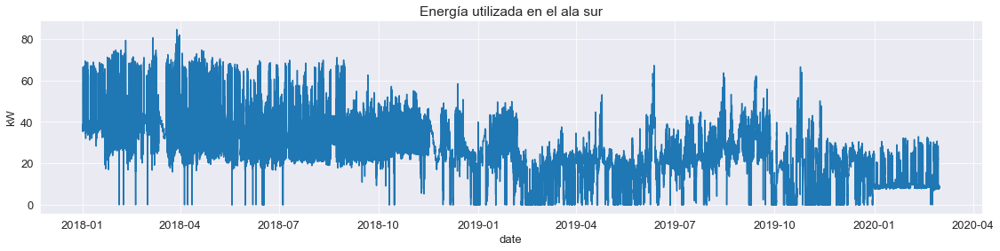

In [14]:
plt.figure(figsize=(19,4))
sns.lineplot(x =energy_use.index , y=energy_use[var])
plt.ylabel('kW')

plt.title('Energía utilizada en el ala sur')

In [14]:
# We crop until March 2020, since it's the expected normal use (covid effect)

energy_use=energy_use[energy_use.index < '2020-03-01 00:00:00']


In [15]:
energy_use = energy_use.resample('15T').mean()


### 1. Trend



In [61]:
#print(mk.original_test(energy_use[var], alpha=0.05))

We could use hodrick prescott filter ( more info on https://analyticsindiamag.com/a-complete-guide-to-hodrick-prescott-filter-in-time-series-analysis/), it's a mathematical tool that removes the cyclic component of time 
series. However, this tool works better for monthly, annual or quarterly data, and it does not perform well in our kind of data (each 15 min)


We can also get some knowledge about the trend component in the time series with the rolling mean.

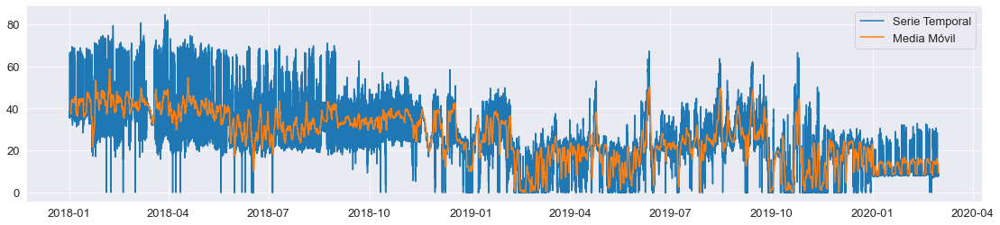

In [62]:
plt.figure(figsize=(19,4))
# calcular la media móvil de la serie temporal
rolling_mean = energy_use[['hvac_N']].rolling(window=96).mean()

#pintamos la serie temporal y la media móvil
plt.plot(energy_use['hvac_N'], label="Serie Temporal")
plt.plot(rolling_mean, label="Media Móvil")
plt.legend()
plt.show()


### 2. Seasonality 

We will study seasonality with Multiple Box Plots and Autocorrelation Plots:

#### Multiple Box Plots

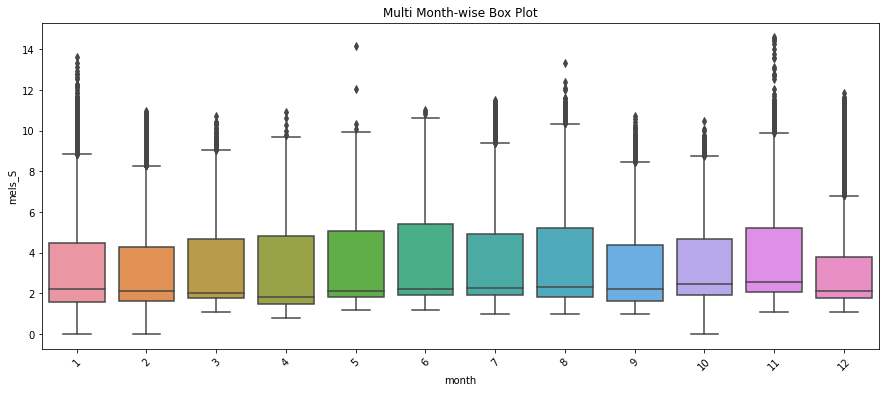

In [19]:
energy_use['month'] = energy_use.index.month
plt.figure(figsize=(15,6))
sns.boxplot(x='month', y=var, data=energy_use)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

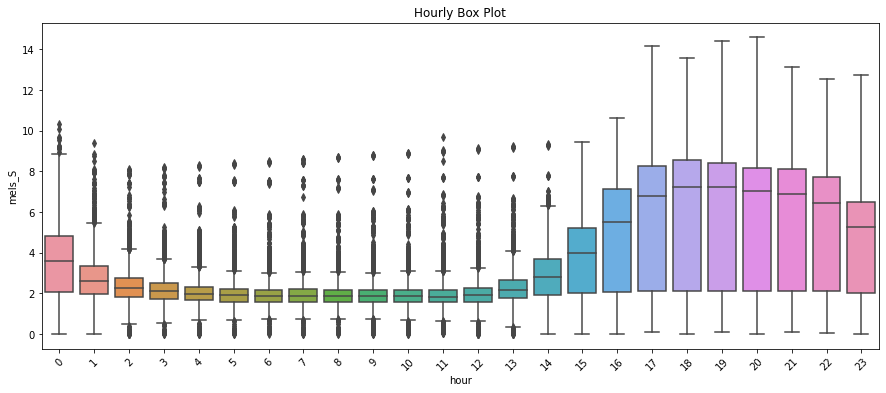

In [20]:
energy_use['hour'] = energy_use.index.hour
plt.figure(figsize=(15,6))
sns.boxplot(x='hour', y=var, data=energy_use)
plt.title("Hourly Box Plot")
plt.xticks(rotation=45)
plt.show()

We can see some seasonal (hourly) pattern, however, the box plots are very wide so we will try to detrend it using differencing to reduce it 



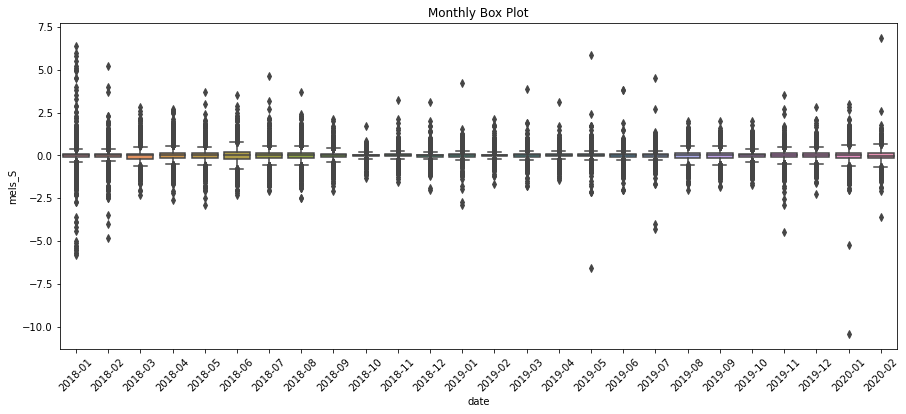

In [30]:
diff = energy_use[var].diff()
months = diff.index.to_period("M")
diff.columns = [var, 'months']
plt.figure(figsize=(15,6))
sns.boxplot(x=months, y=diff)
plt.title("Monthly Box Plot")
plt.xticks(rotation=45)
plt.show()

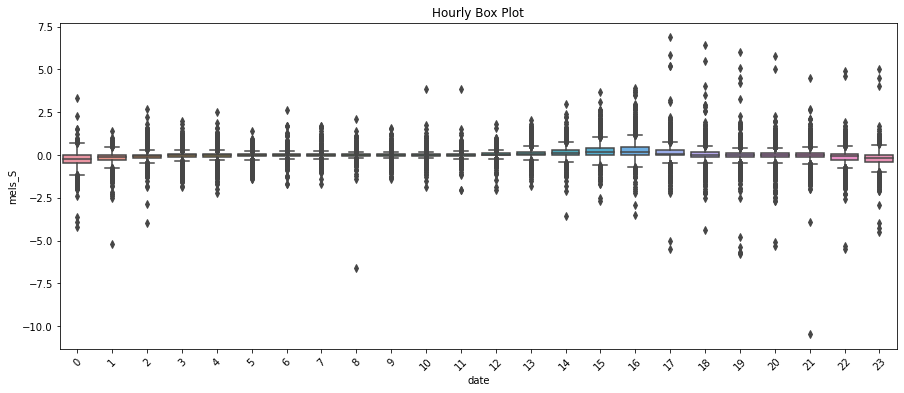

In [31]:
diff = energy_use[var].diff()
hours = diff.index.hour
diff.columns = [var, 'hour']
plt.figure(figsize=(15,6))
sns.boxplot(x=hours, y=diff)
plt.title("Hourly Box Plot")
plt.xticks(rotation=45)
plt.show()

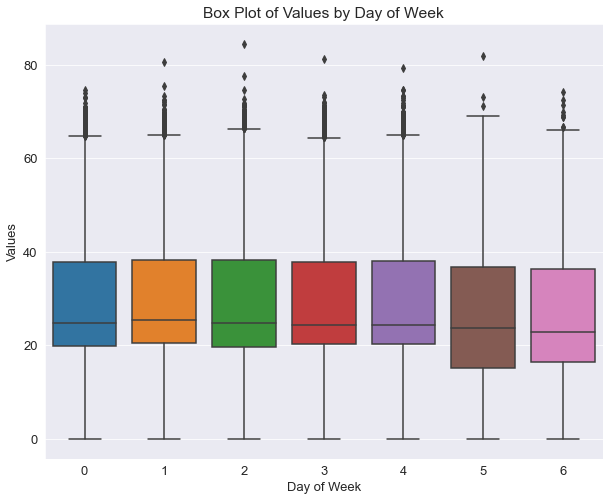

In [123]:
#Day of week
energy_use['day_of_week'] = energy_use.index.dayofweek

# create a box plot of some random values by day of week
sns.boxplot(x='day_of_week', y=var, data=energy_use)
plt.title('Box Plot of Values by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Values')
plt.show()


We can see that there is no seasonality pattern in the day of the week or month since the distributions are consistent. The only seasonality that we can assume is daily, which is the one corresponding to the hourly box plot, where we can clearly see a pattern. Ideally we would want to have more of a drastic difference in the range of the box in each hour, as we commented earlier, however, it can give us a good hint about the seasonality.

It's important to note that while a pattern in a box plot may suggest seasonality, further analysis is needed to confirm this and determine the appropriate methods for modeling and forecasting the data.

#### Autocorrelation and partial autocorrelation plots

Mathematical explanation of autocorrelation plots: https://www.itl.nist.gov/div898/handbook/eda/section3/autocopl.htm



<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

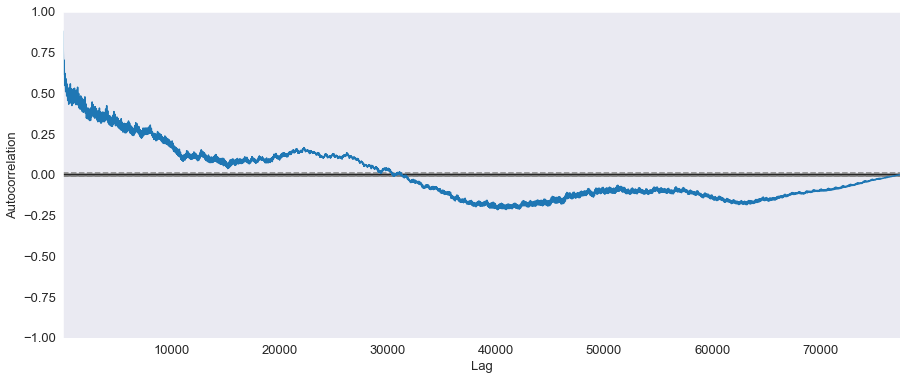

In [124]:
plt.figure(figsize=(15,6))
autocorrelation_plot(energy_use[var].tolist())

(0.0, 500.0)

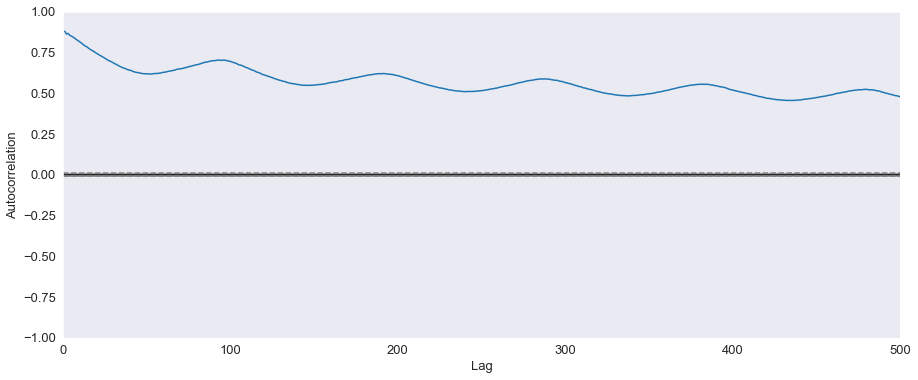

In [125]:
# We limit the plot
plt.figure(figsize=(15,6))

autocorrelation_plot(energy_use[var].tolist()).set_xlim([0,500])

We can see that the autocorrelation plot doesn't get close to 0 until a very high lag. This means that the current value of the time series is influenced by its past values for a long period of time. In other words, there is a strong autocorrelation between the current value and past values of the time series even after many lags.

We are going to check the first 50 lags to see if we can extract some more information




<Figure size 720x432 with 0 Axes>

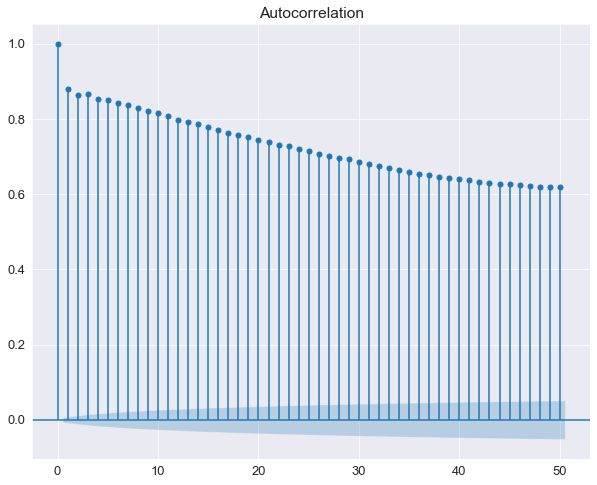

In [131]:
plt.figure(figsize=(10,6))
fig=plot_acf(energy_use[var], lags=50)
plt.show()

#### Partial Autocorrelation Plots

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.

<Figure size 72x432 with 0 Axes>

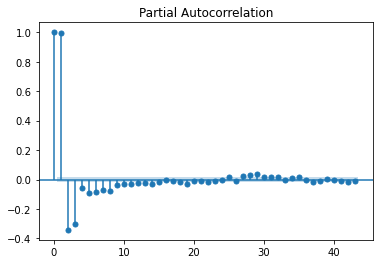

In [24]:
plt.figure(figsize=(1,6))

plot_pacf(energy_use[var],method='ols' ) #Probar varios métodos
plt.show()

[Text(0.5, 1.0, 'Partial Autocorrelation Plot')]

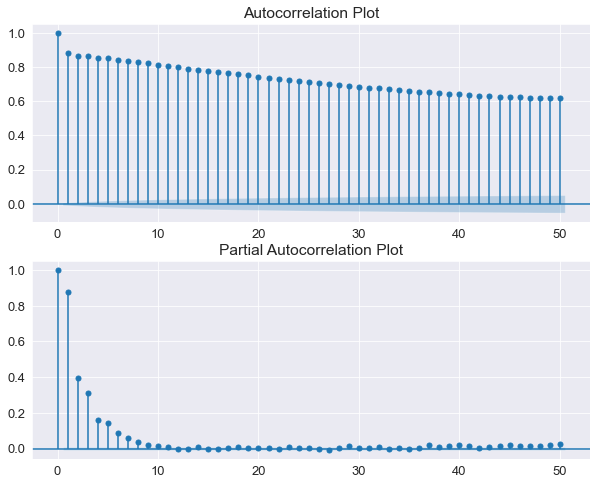

In [128]:
#Complete plot

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Plot the autocorrelation function (ACF) with 50 lags
plot_acf(energy_use[var], lags=50, ax=ax1)
ax1.set(title='Autocorrelation Plot')

# Plot the partial autocorrelation function (PACF) with 50 lags
plot_pacf(energy_use[var], lags=50, ax=ax2)
ax2.set(title='Partial Autocorrelation Plot')

We have two observations to make:
- As we saw earlier, the autocorrelation plot is very high up until a very high lag, this means that there are some significant correlations even at higher lags.

- The partial autocorrelation plot is showing that there are significant correlations between the current value of the time series and its past values up to a certain lag, but after that, the correlations drop off quickly. 

The partial autocorrelation plot may show the correlations between the current value and its past values within a given season or trend, while the autocorrelation plot is capturing the persistence of the overall pattern across multiple seasons or trends.

#### Differenced time series
We are going to check the differenced time series:

[Text(0.5, 1.0, 'Partial Autocorrelation Plot')]

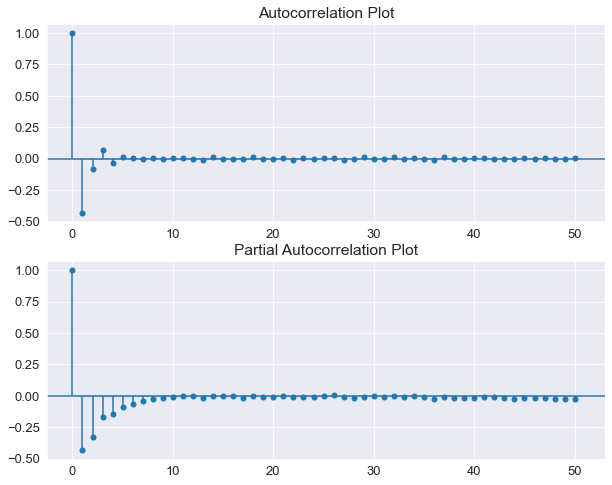

In [134]:
#Complete plot

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Plot the autocorrelation function (ACF) with 50 lags
plot_acf(energy_use[var].diff().dropna(), lags=50, ax=ax1)
ax1.set(title='Autocorrelation Plot')

# Plot the partial autocorrelation function (PACF) with 50 lags
plot_pacf(energy_use[var].diff().dropna(), lags=50, ax=ax2)
ax2.set(title='Partial Autocorrelation Plot')

In this case, the autocorrelation and partial autocorrelation plots of the differenced time series both drop below 0 in the second lag, indicating that there is a strong negative correlation between the observations in the first and second lags, which could suggest that there is a seasonality pattern with a period of 2. 

The fact that the autocorrelation plot had a very high autocorrelation until a very high lag without differencing, and the partial autocorrelation dropped to 0 very quickly, suggests that the time series had a strong trend component that was removed after differencing. This could lead us to belive that the original time series was non-stationary and required differencing to make it stationary.

### 3. Decomposition

In [21]:
def residual_analysis(residuals, lags=40, test_lags = [1, 10], alpha=0.05, title=""):
    """
    Generate various plots and tests to analyze the residuals.

    Parameters:
        residuals (array-like): Residuals to analyze
        lags (int): Number of lags to include in the autocorrelation and partial autocorrelation plots
        alpha (float): Significance level for the Ljung-Box test

    Returns:
        None
    """

    # Create common subplot for all plots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))
    fig.subplots_adjust(hspace=0.5)

    # Autocorrelation plot with confidence intervals
    sm.graphics.tsa.plot_acf(residuals, lags=lags, ax=axes[0, 0], alpha=alpha)
    axes[0, 0].set(title="Autocorrelation Plot",
                  xlabel="Lag", ylabel="Autocorrelation")

    # Partial autocorrelation plot
    sm.graphics.tsa.plot_pacf(residuals, lags=lags, ax=axes[0, 1])
    axes[0, 1].set(title="Partial Autocorrelation Plot", xlabel="Lag", ylabel="Partial Autocorrelation")

    # Q-Q plot
    sm.graphics.qqplot(residuals, line='s', ax=axes[1, 0])
    axes[1, 0].set(title="Q-Q Plot", xlabel="Theoretical Quantiles", ylabel="Sample Quantiles")

    # Histogram plot with kde line
    sns.histplot(residuals, bins=30, kde=True)
    axes[1, 1].set(title="Histogram with KDE Line", xlabel="Residuals", ylabel="Frequency")
    plt.suptitle("Residual analysis for: " + title)
    plt.show()

    # Normality test
    pvalue = normaltest(residuals)[1]
    if pvalue < alpha:
        print("The residuals do not follow a normal distribution (p-value = {:.20f}, alpha = {})".format(pvalue, alpha))
    else:
        print("The residuals follow a normal distribution (p-value = {:.20f}, alpha = {})".format(pvalue, alpha))

    # Ljung-Box test
    test_results = acorr_ljungbox(residuals, lags=test_lags, auto_lag=True)
    pvalues = test_results['lb_pvalue']
    if np.any(pvalues < alpha):
        print("The residuals are autocorrelated (some p-values < alpha = {:.10f})".format(alpha))
        print(test_results)
    else:
        print("The residuals are not autocorrelated (all p-values >= alpha = {:.10f})".format(alpha))

    dw = durbin_watson(residuals)
    print("Durbin Watson: ", dw)
    if (dw >= 1.5 and dw<=2.5):
        print("No autocorrelation")
    else:
        print("Autocorrelation")


#### Basic decomposition
We are going to use the most basic decomposition, and we will study the residuals to check if they are correct

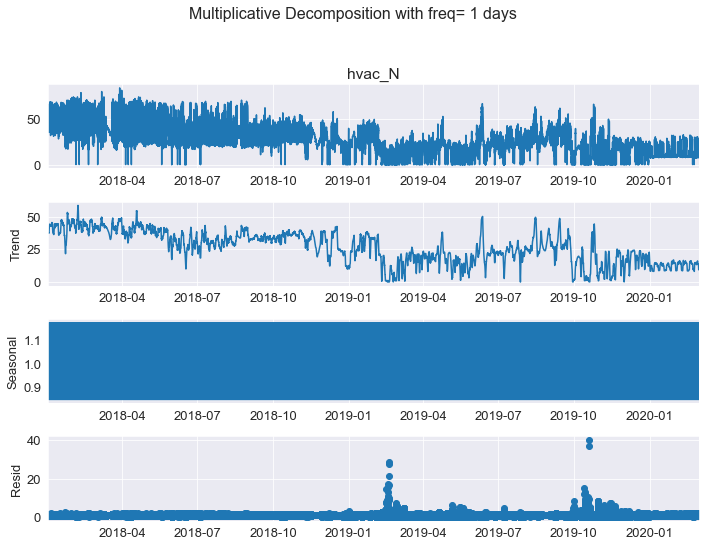

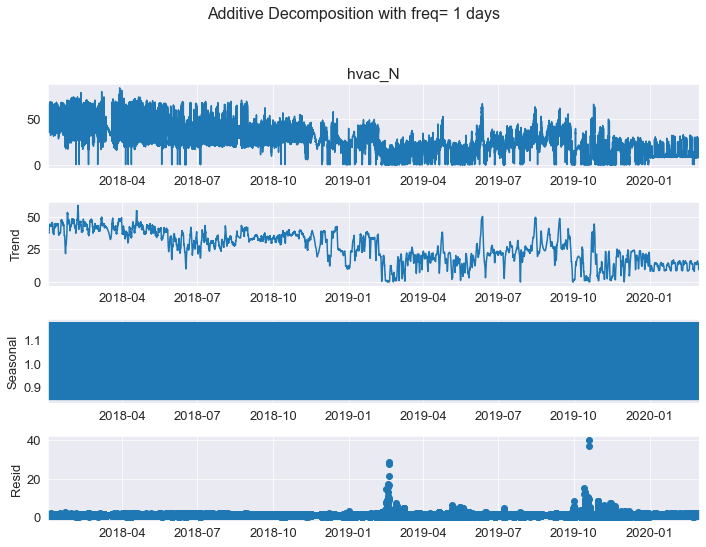

In [16]:
mostrar_descomp(energy_use, var, 96)

We can choose between additive and multiplicative decomposition based on the behavior of the residuals over time.

In an additive decomposition, the residuals are assumed to have a constant variance over time, so if the residuals exhibit constant variability regardless of the size of the trend, then additive decomposition is appropriate. If the residuals show an increasing or decreasing variability with the trend, then multiplicative decomposition is likely to be a better choice.


Since we don't really see much in the last plot, we will compare only the residuals plots

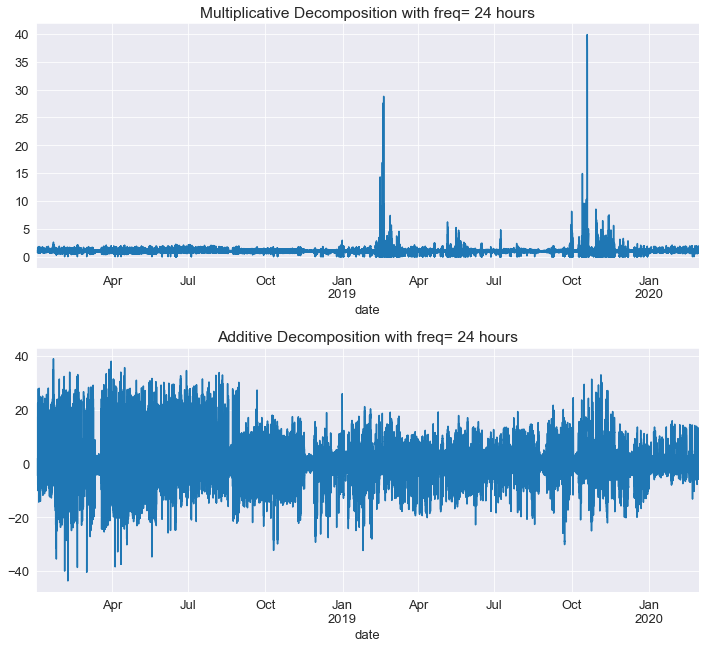

In [17]:
fig, axes = plt.subplots(nrows=2,ncols=1, figsize=(10,10) )

# Multiplicative Decomposition 
period = 96
multiplicative_decomposition = seasonal_decompose(energy_use[var], model='multiplicative', period = period)
# Additive Decomposition
additive_decomposition = seasonal_decompose(energy_use[var], model='add', period = period)
e = multiplicative_decomposition.resid
# Plot
plt.rcParams.update({'figure.figsize': (10,8)})

multiplicative_decomposition.resid.plot(ax=axes[0], title='Multiplicative Decomposition with freq= ' +str(int(period/(4))) + " hours")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])


additive_decomposition.resid.plot(ax=axes[1],title='Additive Decomposition with freq= ' +str(int(period/(4))) + " hours")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

We want to check if the residuals are correlated, we run an analysis on them:

In [18]:
residuals_mul =multiplicative_decomposition.resid.dropna()
residuals_add=additive_decomposition.resid.dropna()

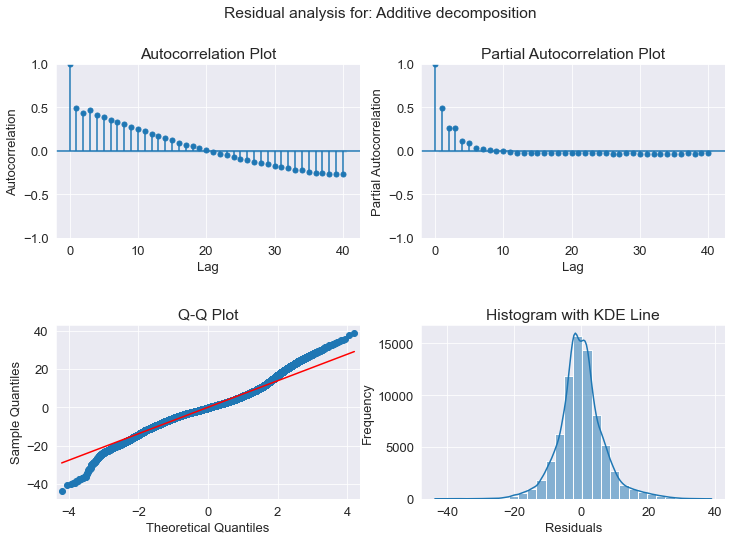

The residuals do not follow a normal distribution (p-value = 0.00000000000000000000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500000000)
            lb_stat  lb_pvalue
1      1.812865e+04        0.0
2      3.253500e+04        0.0
3      4.937964e+04        0.0
4      6.255593e+04        0.0
5      7.424677e+04        0.0
...             ...        ...
75424  4.695355e+06        0.0
75425  4.695358e+06        0.0
75426  4.695360e+06        0.0
75427  4.695362e+06        0.0
75428  4.695365e+06        0.0

[75428 rows x 2 columns]
Durbin Watson:  1.0215431127389871
Autocorrelation


In [21]:
residual_analysis(residuals_add, test_lags=[1,10], title="Additive decomposition")

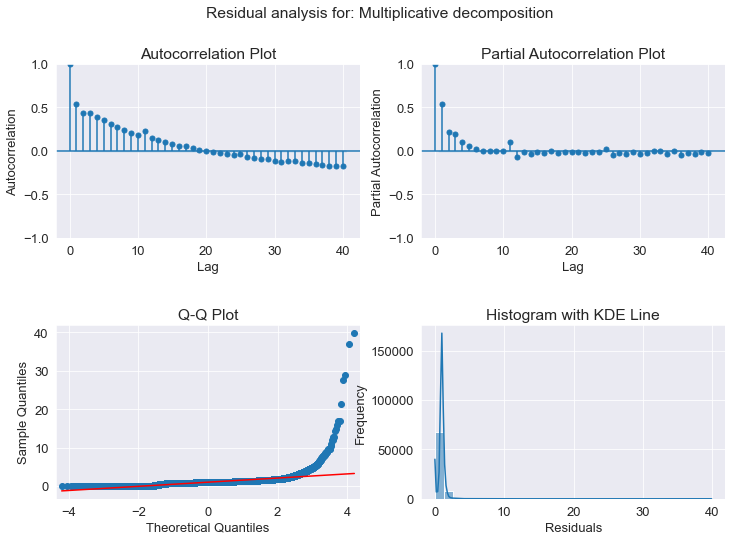

The residuals do not follow a normal distribution (p-value = 0.00000000000000000000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500000000)
            lb_stat  lb_pvalue
1      2.157048e+04        0.0
2      3.621270e+04        0.0
3      5.025093e+04        0.0
4      6.170698e+04        0.0
5      7.112523e+04        0.0
...             ...        ...
73275  1.330280e+06        0.0
73276  1.330285e+06        0.0
73277  1.330289e+06        0.0
73278  1.330292e+06        0.0
73279  1.330295e+06        0.0

[73279 rows x 2 columns]
Durbin Watson:  0.215050731556044
Autocorrelation


In [22]:
residual_analysis(residuals_mul, title="Multiplicative decomposition")

We can see that with period 96 (daily) we don't capture all the underlying patterns in the data, so this means that we have multiple seasonal patterns. 



#### Advanced decompositions

We have seen that there are multiple seasonal components in the data. In these cases, a single seasonal decomposition method with a fixed period is not be enough to capture all the patterns effectively. Therefore, it is important to use decomposition methods that can handle multiple seasonal components.


Due to this situation, we will try two other algorithms to decompose, the MSTL decomposition, that stands for Multiple Seasonal-Trend decomposition using Loess, and Unobserved Components. 



###### MSTL
MSTL is a method to decompose a time series into a trend component, multiple seasonal components, and a residual component, and it can detect multiple seasonalities by fitting a separate smooth component for each seasonality.



(https://towardsdatascience.com/multi-seasonal-time-series-decomposition-using-mstl-in-python-136630e67530)



In [23]:
from statsmodels.tsa.seasonal import MSTL
mstl = MSTL(energy_use[var], periods=(4,4*12, 96, 96*7), lmbda ='auto', iterate=5).fit()
mstl.plot()
plt.tight_layout()
plt.show()

KeyboardInterrupt: 

In [47]:
residuals_mstl = mstl.resid

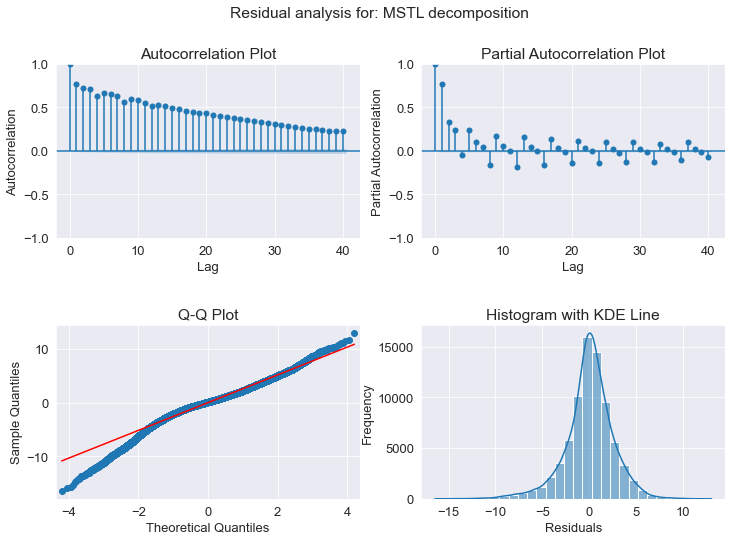

The residuals do not follow a normal distribution (p-value = 0.00000000000000000000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500000000)
            lb_stat  lb_pvalue
1      4.518157e+04        0.0
2      8.562061e+04        0.0
3      1.249253e+05        0.0
4      1.552837e+05        0.0
5      1.899967e+05        0.0
...             ...        ...
69739  2.532252e+06        0.0
69740  2.532254e+06        0.0
69741  2.532257e+06        0.0
69742  2.532259e+06        0.0
69743  2.532261e+06        0.0

[69743 rows x 2 columns]
Durbin Watson:  0.47158217341913894
Autocorrelation


In [48]:
residual_analysis(residuals_mstl, title ="MSTL decomposition")

###### UNOBSERVED COMPONENTS


Another way of modelling multi-seasonal components is extracting them one by one, and in the last one make a generic additive decomposition to obtain the trend and final residual. We can do this manually or automatically with the Unobserved Components class.


https://medium.com/analytics-vidhya/multi-seasonal-time-series-analysis-decomposition-and-forecasting-with-python-609409570007



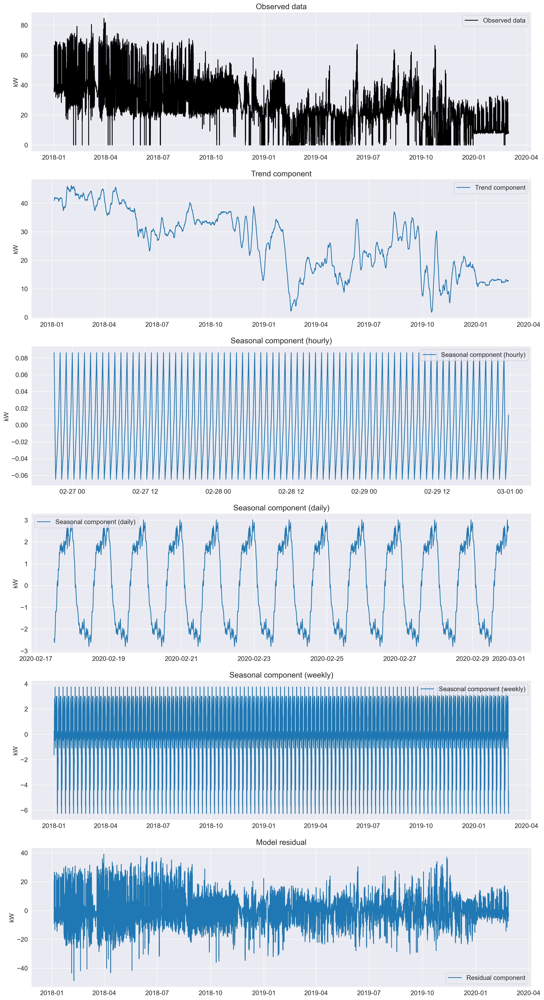

In [25]:


# Multiplicative Decomposition 
period = 4
hvac_N = energy_use[var]
# We extract the hourly seasonal component
additive_decomposition = seasonal_decompose(energy_use[var], model='add', period = period)
seasonal_hourly = additive_decomposition.seasonal

seasonal_daily = seasonal_decompose(hvac_N-seasonal_hourly, model='add', period = 96).seasonal

decomposition_additive_ms = seasonal_decompose(hvac_N-seasonal_hourly-seasonal_daily, model='add', period = 96*7)
seasonal_weekly = decomposition_additive_ms.seasonal



f, axes = plt.subplots(6,1,figsize=(18,36),dpi=200)

#custom plotting of observed train data in style of results class '.plot_components()' method

#plotting observed data
axes[0].plot(energy_use[var], label='Observed data', color='black')
axes[0].legend()

#plotting trend component
axes[1].plot(decomposition_additive_ms.trend.index,decomposition_additive_ms.trend, label='Trend component')
axes[1].legend()


limits = [-300, -1200, 0, 0]
axes[2].plot(seasonal_hourly[-300:].index, seasonal_hourly[-300:], label='Seasonal component (hourly)')
axes[2].legend()

axes[3].plot(seasonal_daily[-1200:].index, seasonal_daily[-1200:], label='Seasonal component (daily)')
axes[3].legend()

axes[4].plot(seasonal_weekly.index, seasonal_weekly, label='Seasonal component (weekly)')
axes[4].legend()



#plotting residuals
axes[5].plot(decomposition_additive_ms.resid.index,decomposition_additive_ms.resid, label='Residual component')
axes[5].legend()

#list of subplot titles
axtitles = ['Observed data',
            'Trend component',
            'Seasonal component (hourly)',
            'Seasonal component (daily)',
            'Seasonal component (weekly)',
            
            'Model residual']

#setting y labels and subplot titles (former is missing from '.plot_components()')
for i,a in enumerate(axes):
    a.set_ylabel('kW')
    a.set_title(axtitles[i])

plt.show()

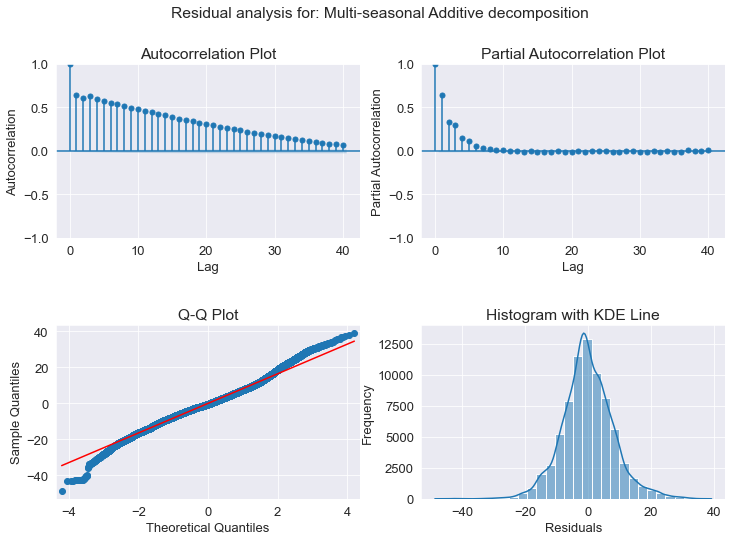

The residuals do not follow a normal distribution (p-value = 0.00000000000000000000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500000000)
            lb_stat  lb_pvalue
1      3.119301e+04        0.0
2      5.887486e+04        0.0
3      8.890528e+04        0.0
4      1.154055e+05        0.0
5      1.404579e+05        0.0
...             ...        ...
74638  3.464212e+06        0.0
74639  3.464215e+06        0.0
74640  3.464218e+06        0.0
74641  3.464220e+06        0.0
74642  3.464222e+06        0.0

[74642 rows x 2 columns]
Durbin Watson:  0.7116137990410409
Autocorrelation


In [26]:
residual_analysis(decomposition_additive_ms.resid.dropna(), title="Multi-seasonal Additive decomposition")

In [16]:
from statsmodels.tsa.statespace.structural import UnobservedComponents

model_UC1 = sm.tsa.UnobservedComponents(energy_use[var],
                                        level='lldtrend',
                                        irregular=True,
                                        stochastic_level = False,
                                        stochastic_trend = False,
                                        stochastic_freq_seasonal = [False, False, False],
                                        freq_seasonal=[{'period': 4, 'harmonics': 2},
                                                       {'period': 96, 'harmonics': 3},
                                                       {'period': 96*7, 'harmonics': 5}])
#fitting model to train data
model_UC1res = model_UC1.fit()

#printing statsmodels summary for model
print(model_UC1res.summary())

print("")

/Users/maguado/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/structural.py:426: SpecificationWarning: Value of `irregular` may be overridden when the trend component is specified using a model string.
  warn("Value of `%s` may be overridden when the trend"
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.71548D+00    |proj g|=  4.93632D-02

At iterate    5    f=  3.15510D+00    |proj g|=  8.89510D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      9     18      1     0     0   3.792D-07   3.154D+00
  F =   3.1544116221504201     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
                               Unobserved Components Results                                
Dep. Variable:                         

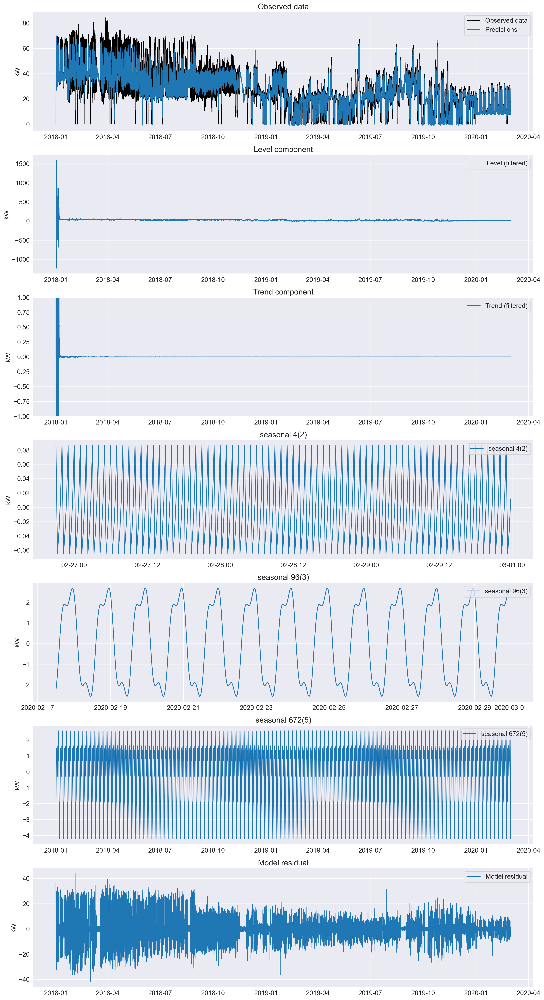

In [36]:
f, axes = plt.subplots(7,1,figsize=(18,36),dpi=200)

#custom plotting of observed train data in style of results class '.plot_components()' method

#plotting observed data
axes[0].plot(energy_use[var], label='Observed data', color='black')
axes[0].plot(model_UC1res.fittedvalues, label='Predictions')
axes[0].legend()

#plotting smoothed level component
axes[1].plot(energy_use[var].index, model_UC1res.level['filtered'], label='Level (filtered)')
axes[1].legend()

#plotting smoothed trend component
axes[2].plot(energy_use[var].index, model_UC1res.trend['filtered'], label='Trend (filtered)')
axes[2].set_ylim(-1,1)
axes[2].legend()

limits = [-300, -1200, 0]

#plotting smoothed seasonal components with arbitrary time window scales
for i in range(3,6,1):
    axes[i].plot(energy_use[var].index[limits[i-3]:], model_UC1res.freq_seasonal[i-3]['smoothed'][limits[i-3]:], label=model_UC1res.freq_seasonal[i-3]['pretty_name'])
    axes[i].legend(loc='upper right')

#plotting residuals
axes[6].plot(energy_use[var].index, model_UC1res.resid, label='Model residual')
axes[6].legend()

#list of subplot titles
axtitles = ['Observed data',
            'Level component',
            'Trend component',
            model_UC1res.freq_seasonal[0]['pretty_name'],
            model_UC1res.freq_seasonal[1]['pretty_name'],
            model_UC1res.freq_seasonal[2]['pretty_name'],
            'Model residual']

#setting y labels and subplot titles (former is missing from '.plot_components()')
for i,a in enumerate(axes):
    a.set_ylabel('kW')
    a.set_title(axtitles[i])

plt.show()

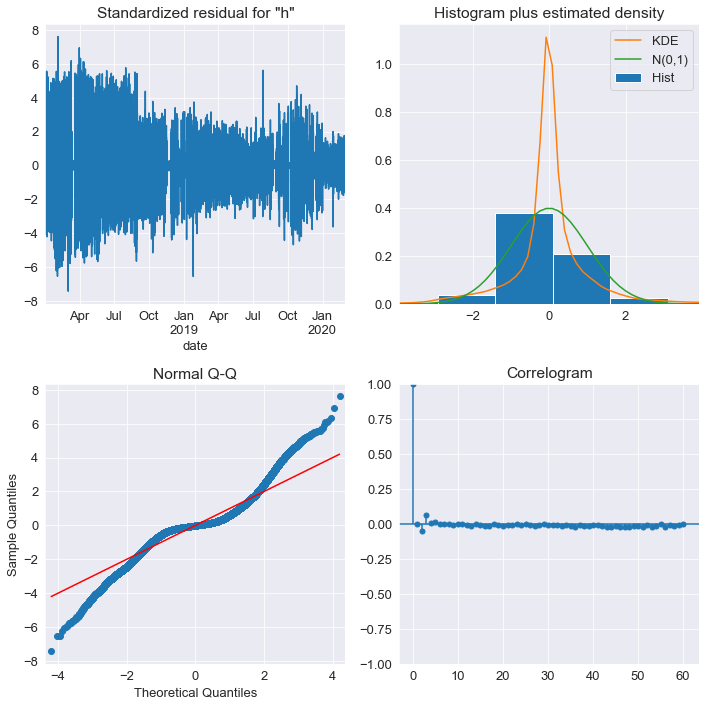

In [ ]:
model_UC1res.plot_diagnostics(figsize=(10,10),lags=60)
plt.tight_layout()
plt.show()

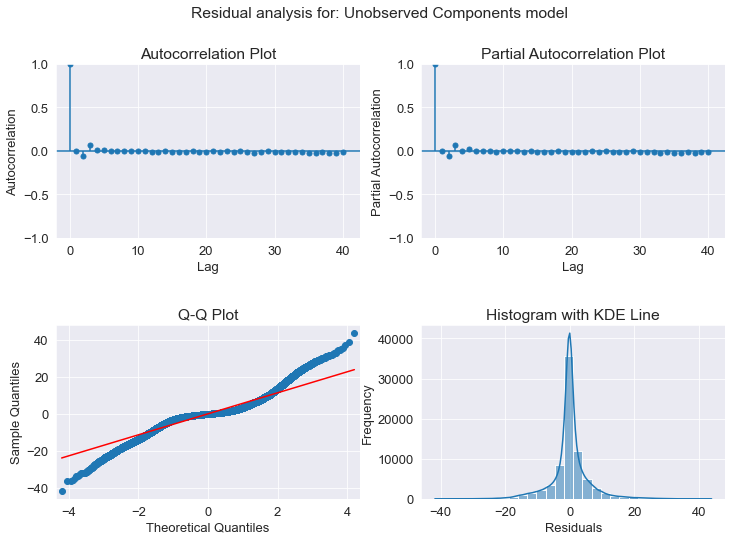

The residuals do not follow a normal distribution (p-value = 0.00000000000000000000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500000000)
           lb_stat      lb_pvalue
1         0.037004   8.474564e-01
2       229.818012   1.246387e-50
3       543.782639  1.547210e-117
4       547.729460  3.170867e-117
5       559.137067  1.359418e-118
...            ...            ...
6813  25481.753928   0.000000e+00
6814  25486.271766   0.000000e+00
6815  25486.792513   0.000000e+00
6816  25491.546480   0.000000e+00
6817  25513.009041   0.000000e+00

[6817 rows x 2 columns]
Durbin Watson:  1.9980329075930598
No autocorrelation


In [24]:
residual_analysis(model_UC1res.resid, title="Unobserved Components model")



### Detrending

Even if we don't really have a clear trend, we want to check these tools and see if there are some subtrends that we didn't catch in our first analysis.(Mathematical explanation in https://link.springer.com/content/pdf/10.1007/978-1-4419-0320-4.pdf)


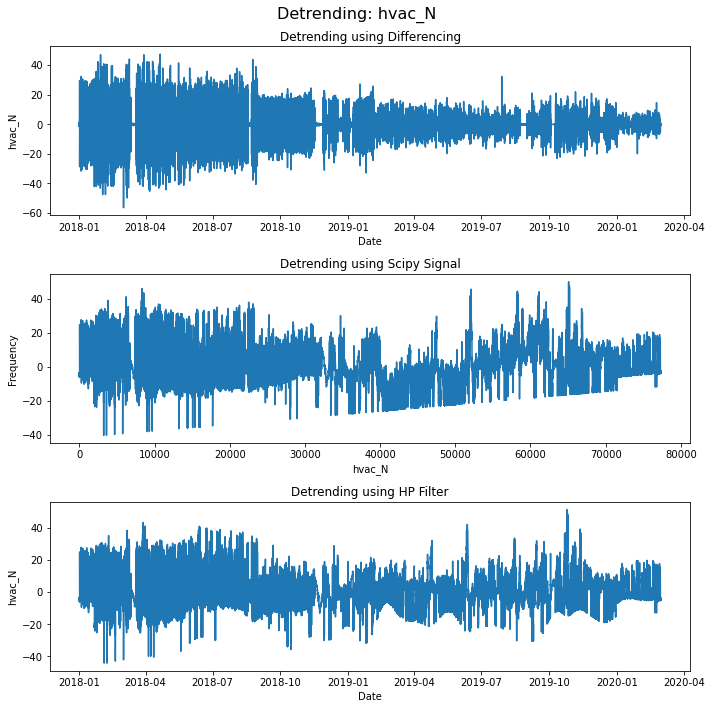

In [25]:
plot_detrends(energy_use, var)

Things to take into account:
- Differencing is the most common way of detrending, since it makes the time series stationary
- Scipy Signal uses the least squares fit as a trend component, and then removes it from the original time series. This has limitations if the trend is non linear
- HP Filter is not very used in time series with such small periods (lambda parameter is too big)


### Seasonal checks

We can use seasonal decomposition to remove seasonality from data and check the data only with the trend, cyclic, and irregular variations.

In [5]:
def plot_seasonal(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    res = result_mul.seasonal

    fig = go.Figure()
    result_mul = seasonal_decompose(energy_use[var], model=model, period = period)
    res = result_mul.seasonal
    fig.add_trace(
        go.Scatter(x=list(df.index), y=list(res)))

    # Set title
    fig.update_layout(
        title_text='seasonal_decompose (' +model+ ' model) with freq= ' +str(int(period/(4*24))) + " days", 
        title_font_size=20
    )

    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1m",
                        step="month",
                        stepmode="backward"),
                    dict(count=6,
                        label="6m",
                        step="month",
                        stepmode="backward"),
                    dict(count=1,
                        label="YTD",
                        step="year",
                        stepmode="todate"),
                    dict(count=1,
                        label="1d",
                        step="day",
                        stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()


In [35]:
plot_seasonal(energy_use, var, 'add', 96*30)

### 6. Rolling Statistics plot

We are going to plot the rolling mean and standard deviation of the time series, with a window of a week (672 rows)

In [142]:
def plot_rolling_stats(series, period):

    #Determine rolling statistics
    rolling_avg = series.rolling(window=period).mean() 
    rolling_std = series.rolling(window=period).std() 

    #Plot rolling statistics
    plt.figure(figsize=(15,7))
    plt.plot(series, color='#379BDB', label='Original')
    plt.plot(rolling_avg, color='#D22A0D', label='Rolling Mean')
    plt.plot(rolling_std, color='#142039', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation with rolling window of= ' +str(int(period/(4*24))) + " days")
    plt.show(block=False)




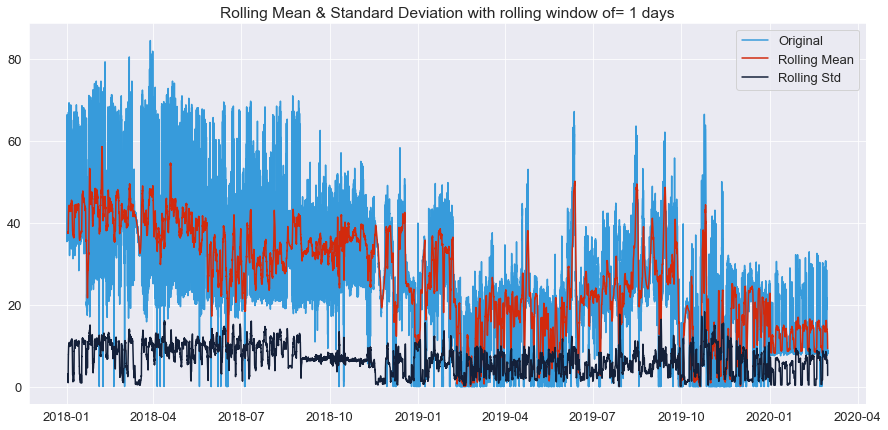

In [144]:
plot_rolling_stats(energy_use[var], 96)

Next, we will repeat the exact same plot but this time with the differenced time series, to check how the statistical properties change with time:


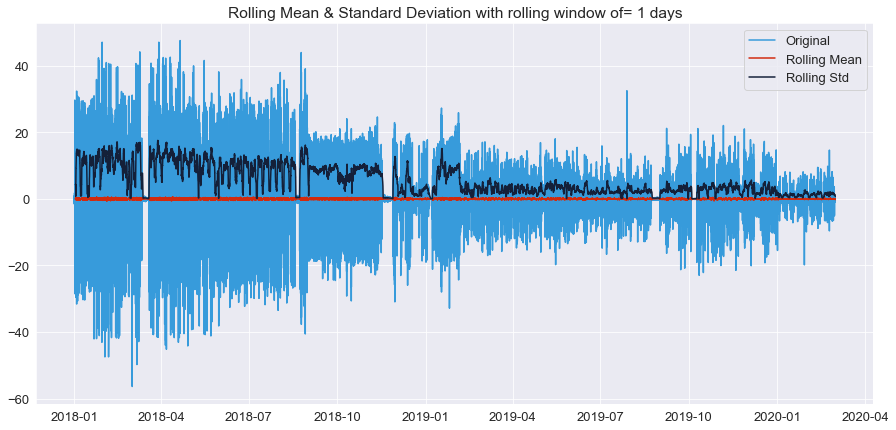

In [145]:
plot_rolling_stats(energy_use[var].diff().dropna(), 96)

### 7. Dickey Fuller and KPSS Test for stationarity

Finally, we will run the dickey fuller (https://atsa-es.github.io/atsa-labs/sec-boxjenkins-aug-dickey-fuller.html) test and the KPSS test on this variable. Possible outcomes are:

- Case 1: Both tests conclude that the series is not stationary - The series is not stationary
- Case 2: Both tests conclude that the series is stationary - The series is stationary
- Case 3: KPSS indicates stationarity and ADF indicates non-stationarity - The series is trend stationary. Trend needs to be removed to make series strict stationary. The detrended series is checked for stationarity.
- Case 4: KPSS indicates non-stationarity and ADF indicates stationarity - The series is difference stationary. Differencing is to be used to make series stationary. The differenced series is checked for stationarity.


In [39]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(energy_use[var], autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  

ADF Statistic: -9.444020985398895
n_lags: 4.809349879318793e-16
p-value: 4.809349879318793e-16
Critial Values:
   1%, -3.4304363052518982
Critial Values:
   5%, -2.8615781454347933
Critial Values:
   10%, -2.5667903035035597


In [37]:
from statsmodels.tsa.stattools import kpss

kpsstest = kpss(energy_use[var], regression="c", nlags="auto")
kpss_output = pd.Series(
    kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
)
for key, value in kpsstest[3].items():
    kpss_output["Critical Value (%s)" % key] = value
print(kpss_output)

Test Statistic            25.604963
p-value                    0.010000
Lags Used                161.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


/var/folders/bj/wg2_mprn1fl8bf0h7tq_sh2c0000gn/T/ipykernel_20961/1351943483.py:3: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




Since the p-value in the ADF test is lower than 0.5, we can reject the null hypothesis "the time series is non stationary", this means that the series doesn't have a unit root and is stationary.
However, the KPSS test gives us a p-value lower than 0.5, so we can reject the null hypothesis "The process is trend stationary", which means that the series is non stationary.
This means that the series is difference stationary, we repeat both tests on the differenced series:



In [40]:
result = adfuller(energy_use[var].diff().dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  


ADF Statistic: -56.55243679197346
n_lags: 0.0
p-value: 0.0
Critial Values:
   1%, -3.4304363063909644
Critial Values:
   5%, -2.8615781459382337
Critial Values:
   10%, -2.566790303771525


In [41]:
kpsstest = kpss(energy_use[var].diff().dropna(), regression="c", nlags="auto")
kpss_output = pd.Series(
    kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
)
for key, value in kpsstest[3].items():
    kpss_output["Critical Value (%s)" % key] = value
print(kpss_output)

Test Statistic             0.002651
p-value                    0.100000
Lags Used                263.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


/var/folders/bj/wg2_mprn1fl8bf0h7tq_sh2c0000gn/T/ipykernel_20961/2378123738.py:1: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




This time the KPSS test assures us that the series is stationary.

## Grouped by hour time series





In [148]:
# Importamos csv
energy_use['hour'] = energy_use.index.to_period("h")
energy_grouped = energy_use.groupby('hour').mean()
energy_grouped.index = energy_grouped.index.to_timestamp()

The first variable we will study is 'mels_S' (miscellaneous energy use in the south wing of the building).

In [151]:
var = 'hvac_N'

Text(0.5, 1.0, 'HVAC in North Wing')

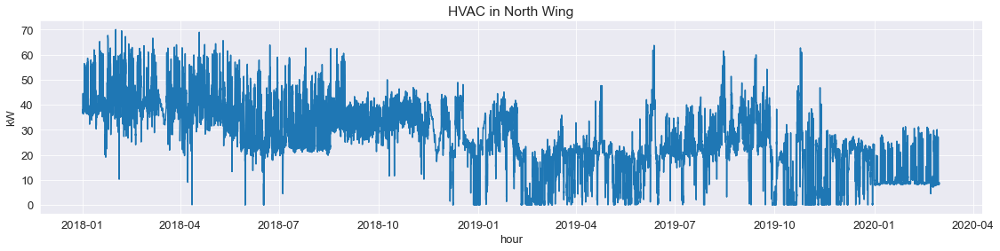

In [153]:
plt.figure(figsize=(19,4))
sns.lineplot(x =energy_grouped.index , y=energy_grouped[var])
plt.ylabel('kW')

plt.title('HVAC in North Wing')